In [1]:
from JupyterImport import *
root_logger.setLevel(logging.WARNING)

In [2]:
dats = get_dats((7472, 7488+1))  # Theta vs HQPC bias at 100mK, -50mT, 1000mV/s only, 300Hz cutoff on current amp
dats.extend(get_dats((7590, 7598+1)))

dats = CU.order_list(dats, [dat.Logs.fds['R2T/0.001'] for dat in dats])

100% (17 of 17) |########################| Elapsed Time: 0:00:55 Time:  0:00:55
100% (9 of 9) |##########################| Elapsed Time: 0:00:30 Time:  0:00:30


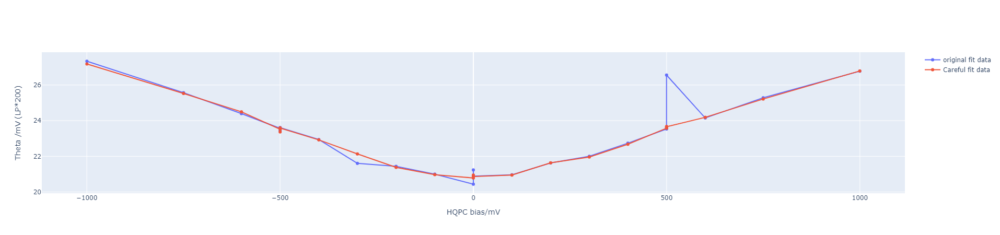

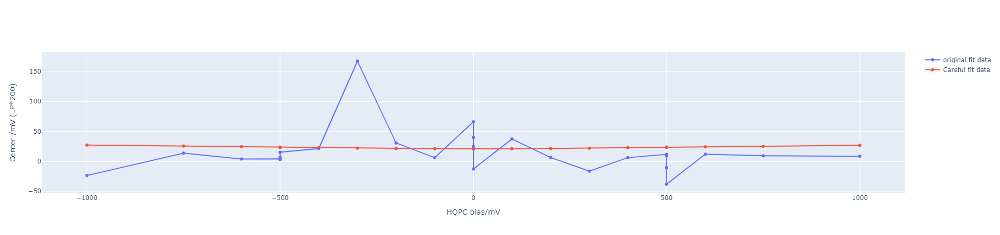

In [5]:
hqpc_biases = set([round(dat.Logs.fds['R2T/0.001']) for dat in dats])

hover_template = 'Datnum: %{customdata[0]}<br>HQPC bias:%{x:.3f}mV<br>Theta:%{y:.3f}mV (LP*200)'


for data_key, ylabel, title, fname in zip(['theta', 'mid'], ['Theta /mV (LP*200)', 'Center /mV (LP*200)'], ['DCbias: Theta Vs HQPC bias', 'DCbias: Center vs HQPC bias'], ['ThetaVsHPQC', 'CenterVsHQPC']):
    
    ratio = round(np.mean([-1*dat.Logs.fds['TC/0.001']/dat.Logs.fds['R2T/0.001'] if not np.isclose(dat.Logs.fds['R2T/0.001'],0) else 0 for dat in dats]), 4)

    data = np.array([getattr(dat.Transition.avg_fit.best_values, data_key) for dat in dats])
    
    better_data = np.array([CU.get_nested_attr_default(i ,'avg_fit.best_values.theta', np.nan) for i in infos])
#     better_data = np.array([np.nanmean([f.best_values.theta for f in np.array(dat.Transition.all_fits)[info.accepted_rows]]) for dat, info in zip(dats, infos)])

    
    x = np.array([dat.Logs.fds['R2T/0.001'] for dat in dats])
    title = [f'{title}<br>Dats{dats[0].datnum}->{dats[-1].datnum}: Channel bias ratio = {ratio}']
    
    customdata = np.tile(np.array([[dat.datnum] for dat in dats]), (data.shape[-1], 1))
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(mode='lines+markers', x=x, y=data, customdata=customdata, hovertemplate=hover_template, name='original fit data'))
    fig.add_trace(go.Scatter(mode='lines+markers', x=x, y=better_data, customdata=customdata, hovertemplate=hover_template, name='Careful fit data'))
    fig.update_layout(xaxis_title='HQPC bias/mV', yaxis_title=ylabel)

    fig.show()

In [ ]:
fig.write_html(export_path+f'Dats{dats[0].datnum}-{dats[-1].datnum}{fname}.html')

In [4]:
infos = list()
for dat in progressbar(dats):
    infos.append(EA.calculate_careful_fit(dat, thresh = 1, param='theta'))


N/A% (0 of 26) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--WARNING:src.DatObject.Attributes.Transition:LinAlgError encountered, retrying
100% (26 of 26) |########################| Elapsed Time: 0:00:41 Time:  0:00:41


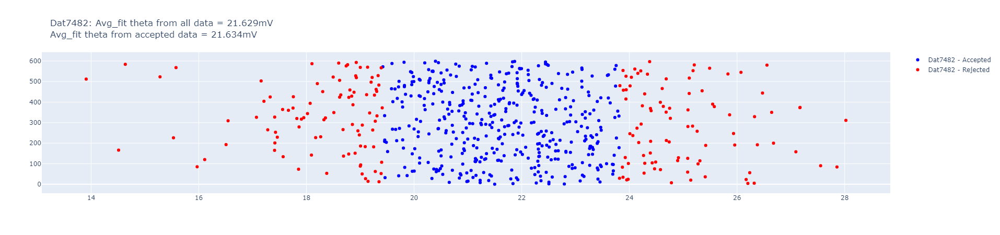

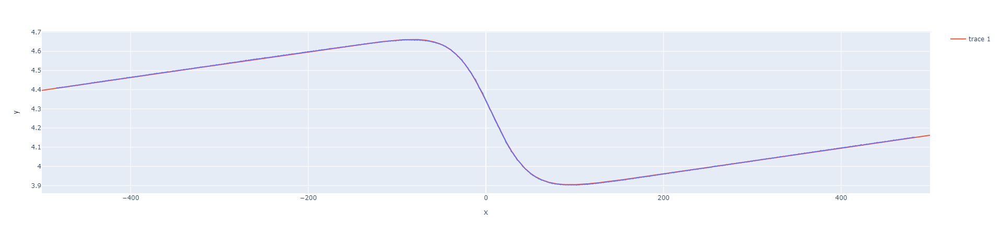

In [3]:
plot_careful_fit = EA.Plots.careful_fit

import plotly.express as px

dd = {dat.datnum: dat for dat in dats}
info = EA.calculate_careful_fit(dd[7482], param='theta')
fig = plot_careful_fit(info=info)
fig2 = px.line(x=info.x, y=info.avg_data)
fig2.add_trace(go.Scatter(mode='lines', x=info.x, y=info.avg_fit.eval_fit(x=info.x)))
fig.show()
fig2.show()

In [ ]:
dat = dd[7598]

centered = CU.center_data_2D(dat.Data.i_sense, [f.best_values.mid for f in dat.Transition.all_fits])
# centered = dat.Data.i_sense
fig = px.imshow(centered[::5, ::5], x=dat.Data.x_array[::5], y=dat.Data.y_array[::5])
fig

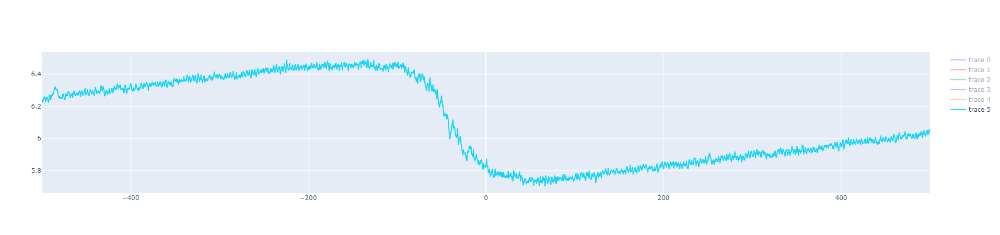

In [18]:
dd = {dat.datnum: dat for dat in dats}
dat = dd[7472]

fig = go.Figure()
for i in [57, 40, 304, 437, 8, 19]:
    fig.add_trace(go.Scatter(mode='lines', x=dat.Data.x_array, y=dat.Data.i_sense[i]+0.1*i))
fig

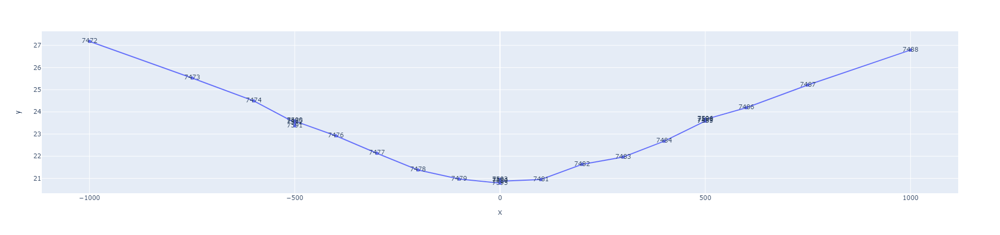

In [9]:
datnums = np.array([dat.datnum for dat in dats])
x = np.array([dat.Logs.fds['R2T/0.001'] for dat in dats])
y = np.array([CU.get_nested_attr_default(i ,'avg_fit.best_values.theta', np.nan) for i in infos])

CU.save_to_mat([datnums, x, y], ['datnums', 'hqpc_bias', 'theta'], 'Temp/ThetaVsDCbias.mat')

import plotly.express as px
px.line(x=x, y=y, text=datnums)